# Birdseye CNN
Matrikelnr. 5504890

The goal of the project is to extract the birds-eye view (BEV) from the imagery of car cameras.
Specifically, we want to distinguish between drivable sections (roads) and non-drivable sections (houses, pavements, etc.).

In detail, a set of input images is mapped to a BEV of the situation [1], in the following image the more difficult task includes not only identifying rode segments but also objects:
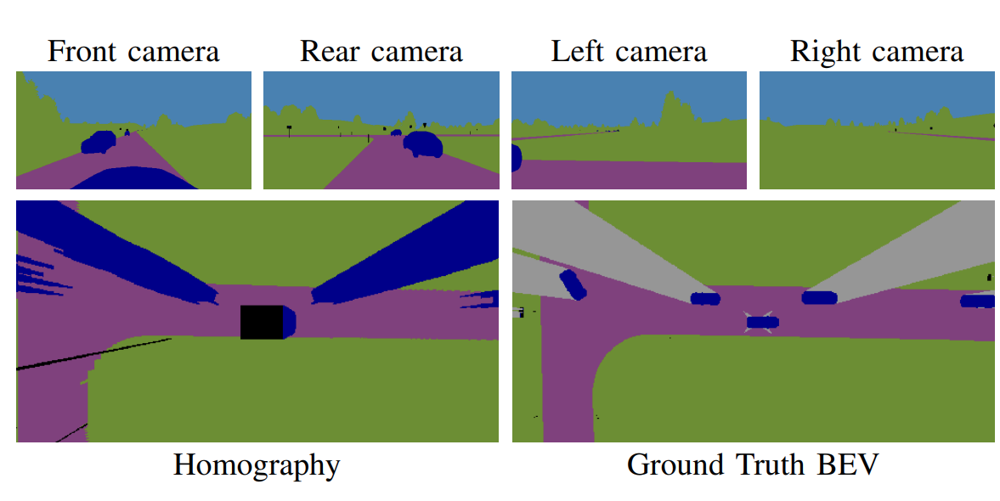
#

## Motivation
The BEV can enable self-driving cars to plan ahead, as they allow for a more accurate representation of surrounding objects.
Multiple approaches to computing the BEV exist [2]. These inlcude:
- Inverse perspective mapping using homography. The surface is assumed to be planar. With knowledge of the camera angle, one can remap the situation to a BEV. Drawbacks include distortion (because an horizontal plane is assumed) and low precision for objects further away from the image, as they are represented by less pixels in the original image [3]:
  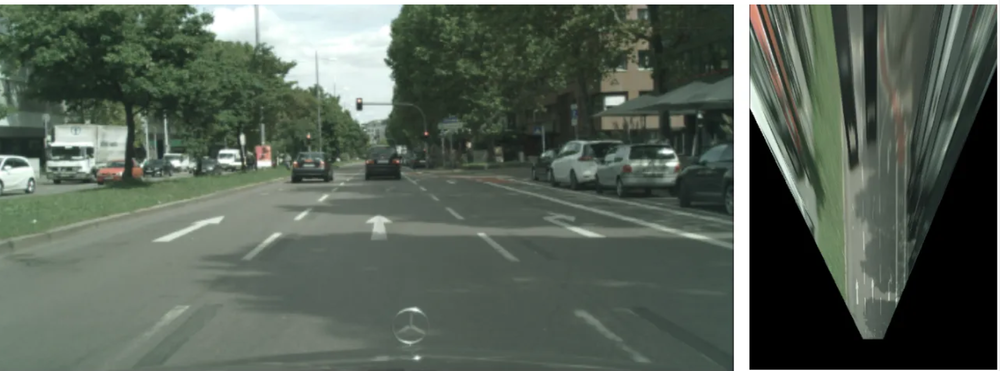

- The surrounding environment can be reconstructed by using lidar sensors.
- Vision based neural networks can be trained in conjunction with labeled BEVs to perform inverse perspective mapping.




# Methodology

- The dataset is constructed with the help of google maps and the street view feature.
- A cnn is trained to construct the birds eye view with the help of the (street-view, maps BEV) pairs.


[1] https://ieeexplore.ieee.org/document/9294462 <br>
[2] https://www.youtube.com/watch?v=TzXuwt56a0E <br>
[3] https://towardsdatascience.com/a-hands-on-application-of-homography-ipm-18d9e47c152f

## Dataset


The dataset is assembled using the standard google street view interface, in an automated manner. The basis for the groundtruth is then the graphical BEV:
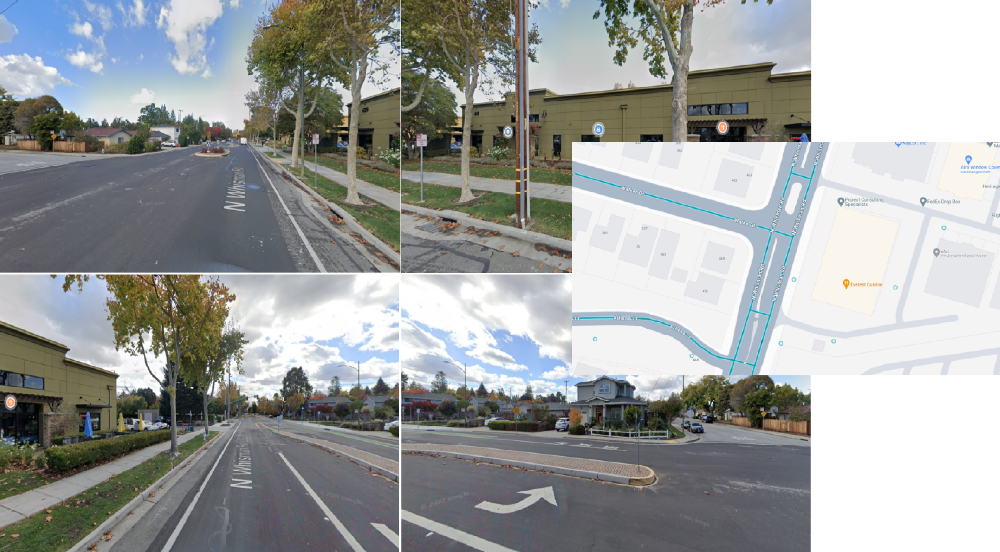
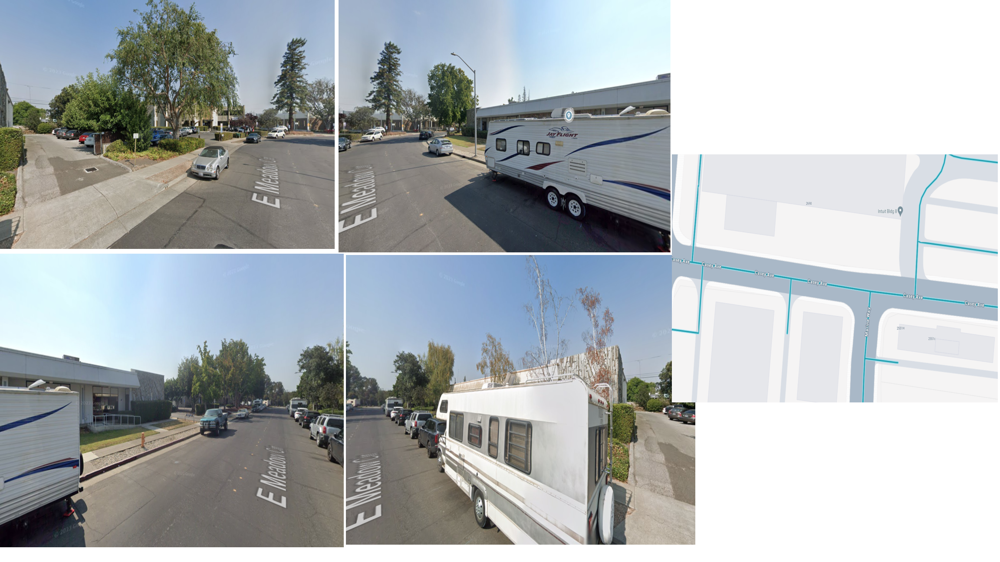

The automation of obtaining the datset from google maps proved rather difficult, and different methods were explored (including using open-cv to determine road angles).
It is settled on an implementation which is unaware of the possible driving direction (It is non-trivial to determine which way the road faces from the input given). So the street-view images are taken in North, East, South and West direction, with the BEV having the correct orientation.
The extraction code can be found here: https://github.com/AmosDinh/CNNbirdseye/blob/main/maps_builder.py

Given the BEV, the target map is extracted, which represents the possible driving/walking area:

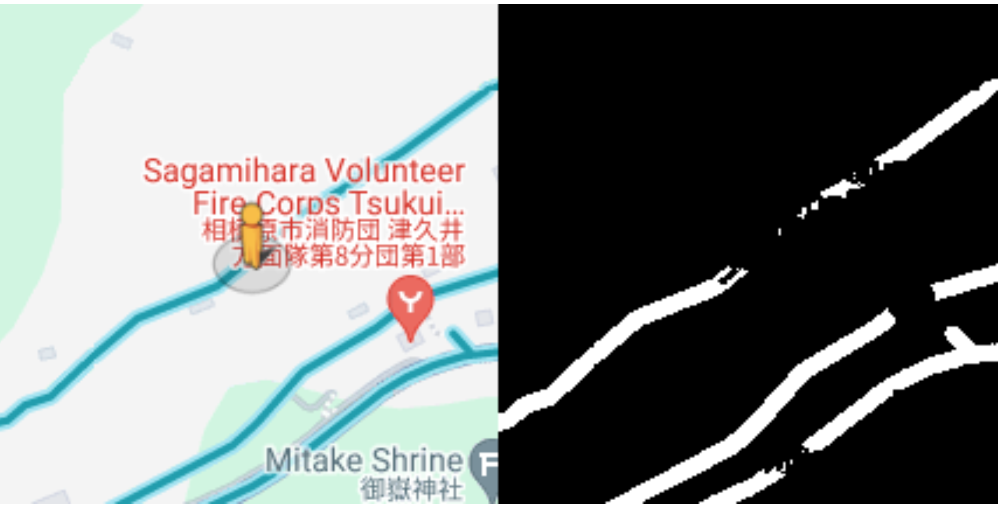

One problem is that road segments are not connected correctly, since text or symbols occlude the road sometimes. 
Again it is settled on leaving the target BEV as is. 
Following methods achieved no success (due to time and computing limitations):
- open-cv based 
- training a CNN (ResNet, UNet) on generated data: Data conists of curved and non-curved white lines on black background, representing the roads, parts of the image are occluded with black noise, the CNN is trained to reconstruct the noisy parts. The task requires the model to understand when road-segments should be connected (many examples are not as trivial as the image above). Below is an example training pair: 
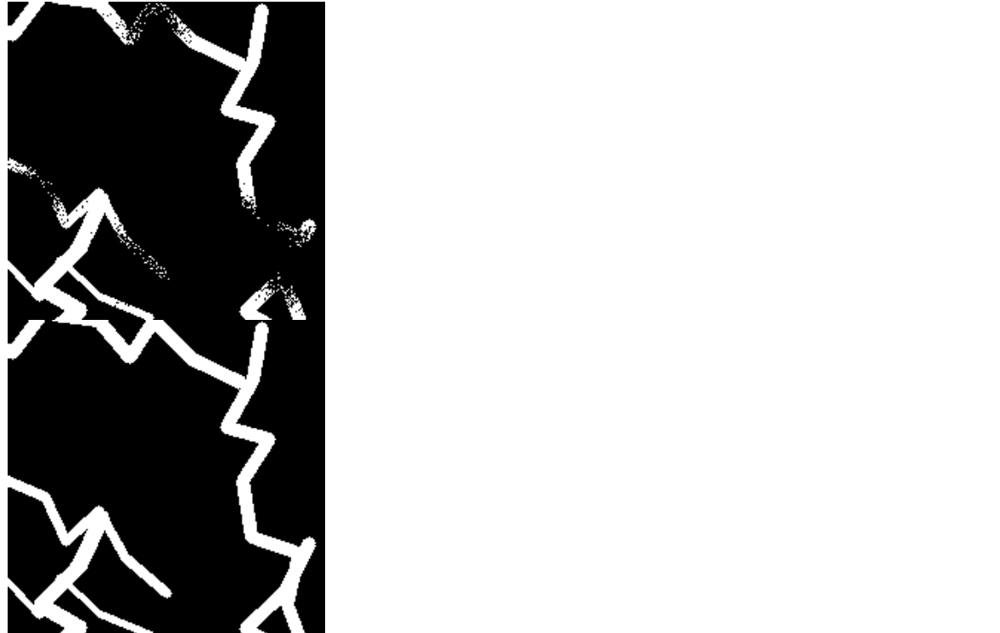


### Inspecting minimal image resolution


Size (320, 180) 0.25


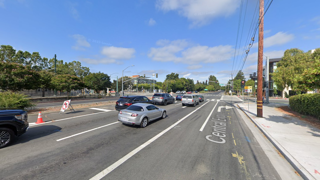

Size (256, 144) 0.2


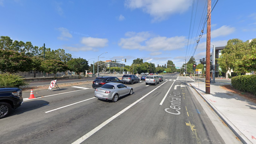

Size (230, 129) 0.18


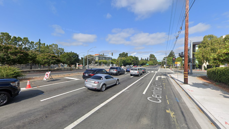

Size (192, 108) 0.15


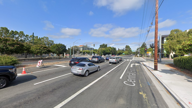

Size (166, 93) 0.13


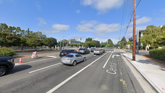

Size (128, 72) 0.1


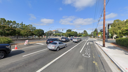

Size (102, 57) 0.08


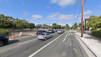

Size (64, 36) 0.05


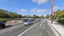

Size (38, 21) 0.03


Size (12, 7) 0.01


In [7]:
from PIL import Image
from copy import deepcopy
test_img =Image.open("images/2023122118210235249308554587-36e8-4f15-838c-a8e2b4012184_Palo_Alto_CA_west.png") 
resize_ratios = [0.25,0.2, 0.18, 0.15, 0.13, 0.1, 0.08, 0.05, 0.03, 0.01]

for ratio in resize_ratios:
    
    width, height = test_img.size
    new_width = int(width * ratio)
    new_height = int(height * ratio)
    new_size = (new_width, new_height)
    print("Size", new_size, ratio)
    img= deepcopy(test_img)
    img.thumbnail(new_size)
    display(img)

The aspect ratio of (256, 144) is chosen, corresponding to a downscaling of 0.2 of the original size. For smaller sizes it may become more difficult for the CNN to detect perpendicular road segments.
<br> Furthermore, the amount of pixels processed (36864) is below that of the standard ResNet (224x224 = 59536), aiding in faster training.

### Data Augmentation

/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/albumentations/augmentations/transforms.py:1284: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


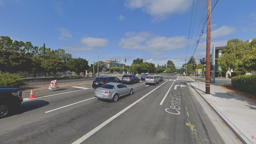

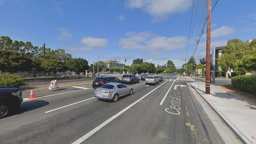

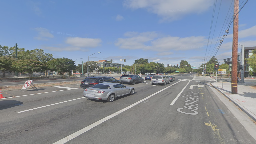

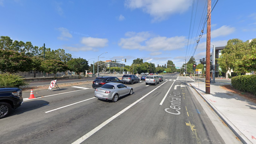

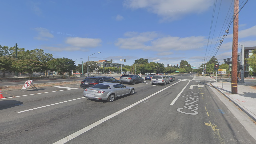

In [12]:
import albumentations as A
test_img =Image.open("images/2023122118210235249308554587-36e8-4f15-838c-a8e2b4012184_Palo_Alto_CA_west.png") 
from torchvision import transforms

import numpy as np
# to numpy array
img = np.array(test_img)

a_transform = A.Compose([
    A.RandomContrast(limit=0.2),
    A.RandomGamma(),
    A.RandomBrightness(),
    A.Blur(blur_limit=2, p=0.1),
    
    A.RandomResizedCrop(height=144, width=256, scale=(0.95, 1.0), p=0.5),  # Random crop
    ],
    additional_targets={  # apply same transform to n, e, s, w images
        'image1': 'image',
        'image2': 'image',
        'image3': 'image',
        })

# apply the transform to the image

# resize the image
width, height = 256,144
for _ in range(5):
    transformed = a_transform(image=img)
    
    transformed_img = transforms.ToPILImage()(transformed['image'])
    transformed_img = transformed_img.resize((width, height))
    
    display(transformed_img)

https://github.com/AmosDinh/CNNbirdseye/blob/main/preprocess_images.py contains the preprocessing code (resizing and extraction of the binary target map)

In [5]:
# image data loader torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
import random
import torch

transform_deeplabv3 = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

class BevDataset(Dataset):
    def __init__(self, image_paths, is_training=False):
        
        self.img_dir = img_dir
        self.images = image_paths
        self.is_training = is_training
        
    def __len__(self):  # for shuffling
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        y_road = Image.open(img_path.replace('_grayscale.png', '_grayscale.png'))
        y_road = transforms.ToTensor()(y_road)
        y_road[y_road > 0] = 1
        y_noroad = torch.ones_like(y_road) - y_road
        n = Image.open(img_path.replace('_grayscale.png', '_north.png'))
        e = Image.open(img_path.replace('_grayscale.png', '_east.png'))
        s = Image.open(img_path.replace('_grayscale.png', '_south.png'))
        w = Image.open(img_path.replace('_grayscale.png', '_west.png'))
        
        if self.is_training:
            # apply same transform to all images
            # pil to numpy
            n = np.array(n)
            e = np.array(e)
            s = np.array(s)
            w = np.array(w)
            transformed = a_transform(image=n, image1=e, image2=s, image3=w)
            n = transformed['image']
            e = transformed['image1']
            s = transformed['image2']
            w = transformed['image3']
            
            #
            
                    
        #n = transform_deeplabv3(n)
        #e = transform_deeplabv3(e)
        #s = transform_deeplabv3(s)
        #w = transform_deeplabv3(w)
        n = transforms.ToTensor()(n)
        e = transforms.ToTensor()(e)
        s = transforms.ToTensor()(s)
        w = transforms.ToTensor()(w)
        
        y = torch.cat([y_road, y_noroad], dim=0)
        
        if self.is_training:
            if random.random() > 0.5:
                # flip y vertically
                y = torch.flip(y, dims=[1])
                n, s = torch.flip(s, dims=[2]), torch.flip(n, dims=[2])
                e = torch.flip(e, dims=[2]) # such that the direction is still correct
                w = torch.flip(w, dims=[2])
                
            if random.random() > 0.5:
                # flip y horizontally
                y = torch.flip(y, dims=[2])
                e, w = torch.flip(w, dims=[2]), torch.flip(e, dims=[2])
                n = torch.flip(n, dims=[2])
                s = torch.flip(s, dims=[2])
                
        return n, e, s, w, y          

img_dir = 'images_preprocessed'
images = [img_dir+'/'+img for img in os.listdir(img_dir) if img.endswith('_grayscale.png')]
# sort images by name
images = sorted(images)
random.seed(14)
random.shuffle(images)
train_images = images[:int(len(images)*0.8)]
val_images = images[int(len(images)*0.8):]

# set random seed
torch.manual_seed(14)


train_dataset = BevDataset(train_images, is_training=True)
val_dataset = BevDataset(val_images, is_training=False) 
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True, num_workers=2, prefetch_factor=1)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True, pin_memory=True)

torch.Size([3, 144, 256]) torch.Size([3, 144, 256]) torch.Size([3, 144, 256]) torch.Size([3, 144, 256]) torch.Size([2, 144, 256])


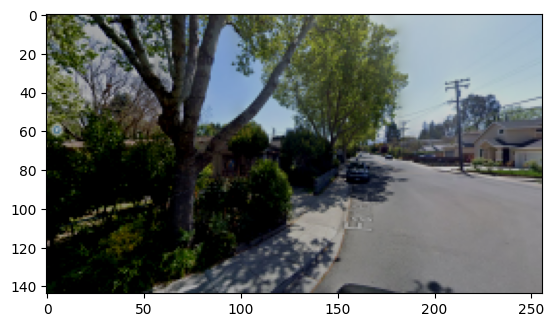

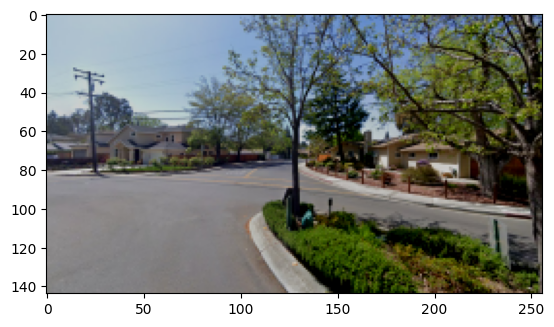

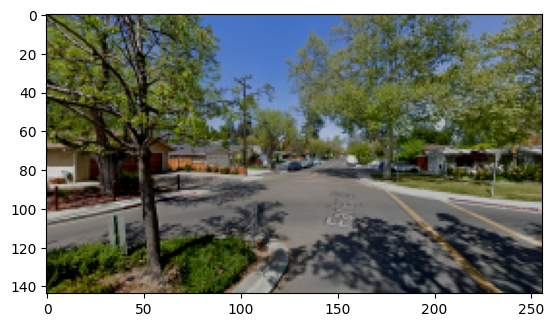

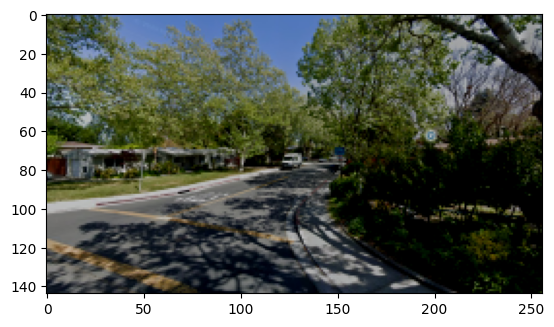

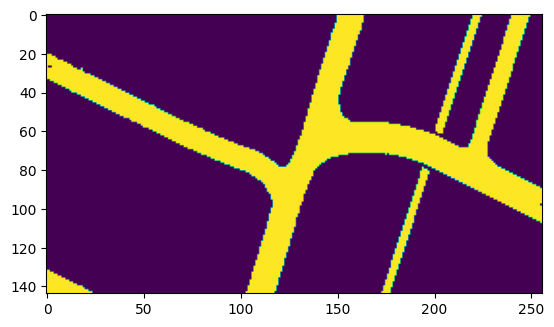

In [6]:
n, e, s, w, y = train_dataset.__getitem__(7)
print(n.shape, e.shape, s.shape, w.shape, y.shape)

import matplotlib.pyplot as plt

def visualize(img, monochrome=False):
    if monochrome:
        plt.imshow(img)
    else:
        plt.imshow(img.permute(1,2,0))
    plt.show()

visualize(n)
visualize(e)
visualize(s)
visualize(w)
visualize(y[0],True)

The flip implementation allows for 4 variations per map.
In total 1714 (*4) images are used for training and 429 for validation.


## Visual Network

As CNN a Deeplab-V3 plus is used [4]. The network is pretrained on image segmentation tasks and serves as baseline [3] compare their model against.

It incorporates atrous convolution to preserve detail in later layers while still being able to condense the visual information[5]:
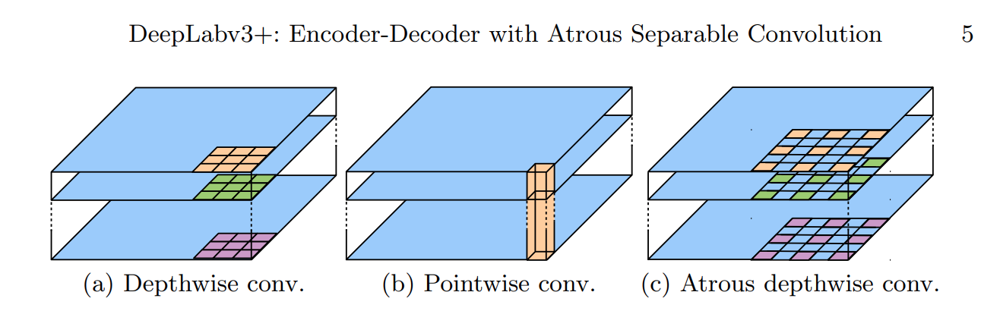

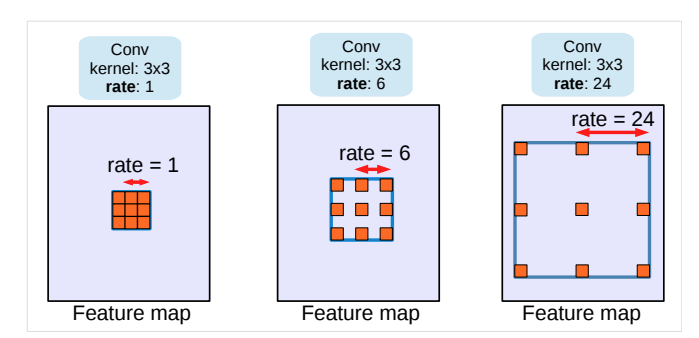
[6]

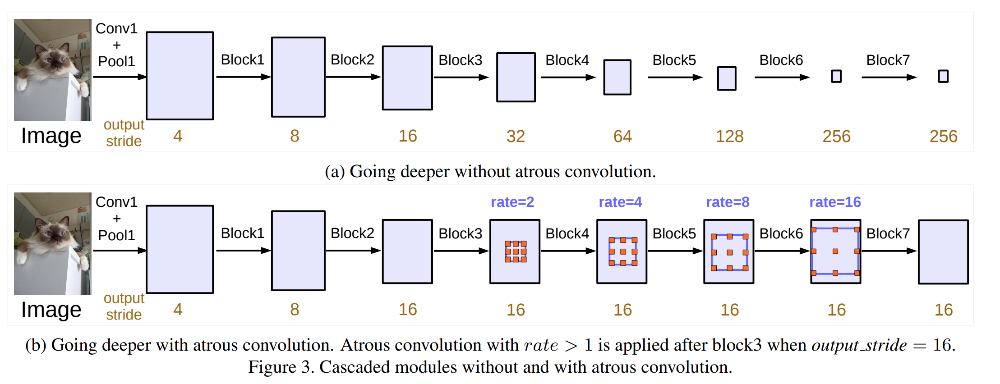
[6]
<br><br>
[4] https://github.com/jfzhang95/pytorch-deeplab-xception?tab=readme-ov-file<br>
[5] https://arxiv.org/abs/1802.02611<br>
[6] https://arxiv.org/abs/1706.05587

The Deeplab-V3 model has the "DeepLabHead" on top of the ResNet, as shown in the model parameters above.
The head contains the atrous spatial pyramid pooling [7]: 
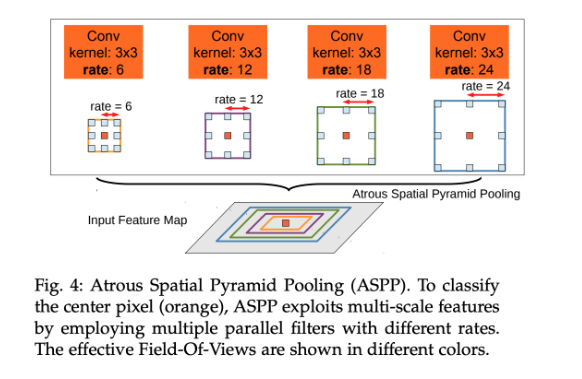

[7] https://arxiv.org/pdf/1606.00915v2.pdf

Since we want to include all four images of the street-view, the forwardpass is executed on each image separately until layer 4. In layer 4 the feature maps of all four image representations are stacked. One rescale layer between layer 3 and layer 4 is added such that the 1024*4 feature maps of the four images are reduced to 1024 feature maps, allowing the layer 4's 1024 kernels to operate on them.

For training, layers starting with layer 3 are unfrozen.

In [ ]:
import torch 
import torchvision 
import numpy as np

class Model(torch.nn.Module):
    def __init__(self, deeplabv3) -> None:
        super().__init__()
        self.resnet = deeplabv3
       
        for param in self.resnet.parameters():
            param.requires_grad = False
            
        
        self.pretrained_separate1 = torch.nn.Sequential(
            self.resnet.backbone.conv1,
            self.resnet.backbone.bn1,
            self.resnet.backbone.relu,
            self.resnet.backbone.maxpool,
            self.resnet.backbone.layer1,
            self.resnet.backbone.layer2
        )
        self.pretrained_separate_unfrezee = self.resnet.backbone.layer3
        
        self.rescale_1 = torch.nn.Sequential(
            torch.nn.Conv2d(4096, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False),
            torch.nn.BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            torch.nn.Conv2d(2048, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False),
            torch.nn.BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        ) # reduce the channels of all four images so it fits into layer 4
        
        self.pretrained_joined_unfreeze = torch.nn.Sequential(
            self.resnet.backbone.layer4,
            self.resnet.classifier[0],
            self.resnet.classifier[1],
            self.resnet.classifier[2],
            self.resnet.classifier[3],
            torch.nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1)) # road or no road
        )
        
        
        for param in self.pretrained_separate_unfrezee.parameters():
            param.requires_grad = True
        for param in self.pretrained_joined_unfreeze.parameters():
            param.requires_grad = True
        
    
    def forward(self, imgs):
        input_shape = imgs[0].shape[-2:]
        results = []
        n_imgs = imgs.shape[0]
        for i in range(n_imgs):
            x = self.pretrained_separate1(imgs[i])
            x = self.pretrained_separate_unfrezee(x)
            results.append(x)
            
        # concatenate along channel axis
        x = torch.cat(results, dim=1)
        x = self.rescale_1(x) # reduce the channels of all four images so it fits into layer 4
        x = self.pretrained_joined_unfreeze(x)
        x = torch.nn.functional.interpolate(x, size=input_shape, mode="bilinear", align_corners=False)
        return x
        

deeplabv3 = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
model = Model(deeplabv3)


n, e, s, w, y = next(iter(train_dataloader))
model_inputs = torch.stack([n,e,s,w], dim=0)
model.eval()
model_outputs = model(model_inputs)

In [18]:
model_inputs.shape

torch.Size([4, 2, 3, 144, 256])

In [6]:
model_outputs.shape

torch.Size([32, 2, 144, 256])

## Loss function
As loss function Cross-Entropy loss is employed. Further, a loss mask is applied, which weighs the loss at the center of the BEV map higher:
Often, from the street-view, it is impossible to determine adjacent roads, which are visible in the BEV.

1.  The approach of using a loss mask is adopted because the outer part of the BEV might still contain useful supervision information. 




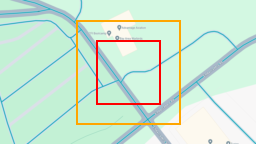

In [9]:
from PIL import Image, ImageDraw
import torch 
resize_width = 256
resize_height = 144

image_path = 'images/2023122117182785646831757876-c500-4fb0-a2ff-f60fc8e34896_Palo_Alto_CA_bev.png'
img = Image.open(image_path).convert('RGB')
# resize
img = img.resize((resize_width, resize_height), Image.BILINEAR)

inner_box = (96,40, 160, 104)
middle_box = (76, 20, 180, 124)
# draw rectangle with inner box
draw = ImageDraw.Draw(img)
draw.rectangle(inner_box, outline='red', width=2)
draw.rectangle(middle_box, outline='orange', width=2)
display(img)

outer_penalty = 0.05
middle_penalty = 0.5
inner_penalty = 1   

loss_mask = torch.ones((resize_height, resize_width)) * outer_penalty
loss_mask[middle_box[1]:middle_box[3], middle_box[0]:middle_box[2]] = middle_penalty
loss_mask[inner_box[1]:inner_box[3], inner_box[0]:inner_box[2]] = inner_penalty

In [10]:
def criterion(pred, target, loss_mask):
    loss = torch.nn.functional.cross_entropy(pred, target, reduction='none')
    loss = torch.multiply(loss, loss_mask) # apply the mask, weighting loss in different regions differently
    return loss.mean()

## Training

In [14]:
# clear cache



In [15]:
from tqdm.auto import tqdm
torch.cuda.empty_cache()
import gc 
gc.collect()

model.cuda()
model.train()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
loss_mask = loss_mask.cuda()
losses = []
for epoch in range(20):
    for i, (n, e, s, w, y) in tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        model_inputs = torch.stack([n,e,s,w], dim=0)
        model_outputs = model(model_inputs.cuda())
        loss = criterion(model_outputs, y.cuda(), loss_mask)
        
        loss.backward()
        if i % 4 == 0:  # batch size 32, so everything fits into gpu
            optimizer.step()
            optimizer.zero_grad()
            tqdm.write('mean loss' + str(np.mean(losses[-100:])), end='')
        losses.append(loss.item())
        
        
    print("Epoch", epoch, "Loss", loss.item())

  0%|          | 0/215 [00:00<?, ?it/s]/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
  0%|          | 0/215 [00:01<?, ?it/s]

mean lossnan

  2%|▏         | 4/215 [00:21<22:31,  6.40s/it]

mean loss0.1669425144791603

  4%|▎         | 8/215 [00:44<20:24,  5.92s/it]

mean loss0.15486181527376175

  6%|▌         | 12/215 [01:10<23:17,  6.88s/it]

mean loss0.15679586802919707

  7%|▋         | 16/215 [01:33<19:49,  5.98s/it]

mean loss0.15417087730020285

  9%|▉         | 19/215 [01:58<20:22,  6.24s/it]


KeyboardInterrupt: 